In [1]:
%matplotlib inline

In [2]:
import functools

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torchvision
import random
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

In [3]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES']='1'

In [4]:
class SkipConnection(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None,submodule=None, outermost=False, innermost=False, 
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(SkipConnection, self).__init__()
        self.outermost = outermost
        if type(norm_layer) == functools.partial:
            use_bias = norm_layer.func == nn.InstanceNorm2d
        else:
            use_bias = norm_layer == nn.InstanceNorm2d
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=use_bias)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            if output_function == nn.Tanh:
                up = [uprelu, upconv, nn.Tanh()]
            else:
                up = [uprelu, upconv, nn.Sigmoid()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

In [5]:
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=32,
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(Generator, self).__init__()
        # construct unet structure
        unet_block = SkipConnection(ngf * 8, ngf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True)
        unet_block = SkipConnection(ngf * 4, ngf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf * 2, ngf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf, ngf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(output_nc, ngf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer, output_function=output_function)

        self.model = unet_block

    def forward(self, input):
        return self.model(input)

In [6]:
device = torch.device('cuda:0')

In [7]:
# Build ResNet 18 Module 

# https://github.com/kuangliu/pytorch-cifar

import torch
import torch.nn as nn
import torch.nn.functional as F


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion *
                               planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out
    
def ResNet18():
    return ResNet(BasicBlock, [2, 2, 2, 2])

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [9]:
generator = Generator(input_nc=6, output_nc=3)
generator = generator.to(device)
generator.apply(weights_init)

classifier = ResNet18()
classifier = classifier.to(device)
classifier.apply(weights_init)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

In [10]:
def prepare_dataloader(num_workers=8,
                       train_batch_size=128,
                       eval_batch_size=256):

    train_transform = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
    ])

    test_transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_set = torchvision.datasets.CIFAR10(root="data",
                                             train=True,
                                             download=True,
                                             transform=train_transform)
    
    test_set = torchvision.datasets.CIFAR10(root="data",
                                            train=False,
                                            download=True,
                                            transform=test_transform)

    train_sampler = torch.utils.data.RandomSampler(train_set)
    test_sampler = torch.utils.data.SequentialSampler(test_set)

    train_loader = torch.utils.data.DataLoader(dataset=train_set,
                                               batch_size=train_batch_size,
                                               sampler=train_sampler,
                                               num_workers=num_workers)

    test_loader = torch.utils.data.DataLoader(dataset=test_set,
                                              batch_size=eval_batch_size,
                                              sampler=test_sampler,
                                              num_workers=num_workers)

    return train_loader, test_loader

In [11]:
train_loader, test_loader = prepare_dataloader()

Files already downloaded and verified
Files already downloaded and verified


In [12]:
# MSE loss
mse_criterion = nn.MSELoss()

ce_criterion = nn.CrossEntropyLoss()

In [13]:
# optimizerG = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))

# optimizerC = optim.Adam(classifier.parameters(), lr=0.01, betas=(0.5, 0.999))

optimizer = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))
optimizer.add_param_group({'params': classifier.parameters()})

In [14]:
class AverageMeter(object):
    """
    Computes and stores the average and current value.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [15]:
# transform = transforms.Normalize(mean=(0.485, 0.456, 0.406), 
#                              std=(0.229, 0.224, 0.225))

In [16]:
def show_images(images):
    grid_img = torchvision.utils.make_grid(images, nrow=3)
    plt.imshow(grid_img.permute(1,2,0))
    plt.show()

In [17]:
best_generator_loss = 1

In [18]:
best_classifier_loss = 1

In [19]:
# Training generator 

def train_generator(train_loader, epoch, generator, mse_criterion, cuda=True, show=True):
    generator.train()
    
    g_losses = AverageMeter()
    
    output_images = []

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        real_label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            real_label = real_label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        
        # Backward
        g_loss.backward()

        optimizerG.step()
    
    print('Training generator - Epoch {} g_loss = {}'.format(epoch, g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)

In [20]:
# Training classifier 

def train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True):
    generator.eval()
    classifier.train()

    c_losses = AverageMeter() 
    
    correct = 0
    total = 0

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()
        
        # Select half dataset for container images
        pivot = len(image) 
        container_image = torch.zeros(image.shape)

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            image = image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        with torch.no_grad():
            privacy_image = generator(gen_input_v)
        print(privacy_image)
        print(privacy_image)
        pred_label = classifier(privacy_image)
        pred_label = pred_label.to(device)

        # Calculate loss 
        c_loss = ce_criterion(pred_label, label)
        
        # Average loss 
        c_losses.update(c_loss.data, pivot)
        
        # Backward
        c_loss.backward()

        optimizerC.step()
        
        # Calculate accuracy
        _, predicted = pred_label.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    
    print('Training classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))

In [21]:
def test_generator(test_loader, generator, mse_criterion, cuda=True, show=True):    
    global best_generator_loss
    
    generator.eval()
    
    g_losses = AverageMeter() 
    
    output_images = []
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) // 2 
            container_image = image[0:pivot, :, :, :]
            real_image = image[pivot:pivot*2, :, :, :]
            real_label = label[pivot:pivot*2]

            gen_input = torch.cat([container_image, real_image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                real_image = real_image.to(device)
                real_label = real_label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)

            # Average loss 
            g_losses.update(g_loss.data, pivot)
    
    
    print('Testing generator - g_loss = {}'.format(g_losses.avg))    
    
    # Save checkpoint 
    if g_losses.avg < best_generator_loss:
        best_generator_loss = g_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/my_best_generator_loss.pth')
        print('Save best checkpoint with loss {}'.format(g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)        

In [22]:
def test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_classifier_loss
    generator.eval()
    classifier.eval()
 
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) 
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            print('container shape: ', container_image.shape)
            print('original image shape: ', image.shape)
            print('privacy shape: ', privacy_image.shape)
            import pdb; pdb.set_trace()
            pred_label = classifier(privacy_image)
            
            # Calculate loss 
            c_loss = ce_criterion(pred_label, label)

            # Average loss 
            c_losses.update(c_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred_label.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('Testing classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))         
    # Save checkpoint 
    if c_losses.avg < best_classifier_loss:
        best_classifier_loss = c_losses.avg
        torch.save(classifier.state_dict(), 'checkpoints/my_best_classifier_loss.pth')
        print('Save best checkpoint with loss {}'.format(c_losses.avg))

In [23]:
# Training generator first
# for epoch in range(100):
#     show = False
#     if epoch % 20 == 0:
#         show = True
#     train_generator(train_loader, epoch, generator, mse_criterion, show=show)
#     test_generator(test_loader, generator, mse_criterion, show=show)

In [24]:
# generator.load_state_dict(torch.load('checkpoints/best_generator_loss.pth'))

In [25]:
# test_generator(test_loader, generator, mse_criterion, show=True)

In [26]:
# for epoch in range(100):
#     train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True)
#     test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)

In [27]:
def train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True):
    generator.train()
    classifier.train()
    
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    output_images = []
    print('Training - Epoch {}'.format(epoch))
    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        pred = classifier(privacy_image)
        pred = pred.to(device)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        c_loss = ce_criterion(pred, label)
        overall_loss = 0.8 * g_loss + 0.2 * c_loss
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        c_losses.update(c_loss.data, pivot)
        overall_losses.update(overall_loss.data, pivot)
        
        # Backward
        overall_loss.backward()

        optimizer.step()
        
        # Calculate accuracy
        _, predicted = pred.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))
    # Show some output images
    if show:
        show_images(output_images)

In [28]:
best_overall_loss = 100
def test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_overall_loss
    generator.eval()
    classifier.eval()
 
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    output_images = []
    print('Testing - Epoch {}'.format(epoch))
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            pivot = len(image)
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            pred = classifier(privacy_image)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)
            c_loss = ce_criterion(pred, label)
            overall_loss = 0.8 * g_loss + 0.2 * c_loss

            # Average loss 
            g_losses.update(g_loss.data, pivot)
            c_losses.update(c_loss.data, pivot)
            overall_losses.update(overall_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))      
    # Save checkpoint 
    if overall_losses.avg < best_overall_loss:
        best_overall_loss = overall_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/best_e2e_w82_generator_loss.pth')
        torch.save(classifier.state_dict(), 'checkpoints/best_e2e_w82_classifier_loss.pth')
        print('Save best checkpoint with overall loss {} - g_loss {} - c_loss {}'.format(overall_losses.avg, g_losses.avg, c_losses.avg))
    if show:
        show_images(output_images)

Training - Epoch 0
overall - overall_loss = 0.45040613412857056
generator - g_loss = 0.028583575040102005
classifier - c_loss = 2.1376962661743164 acc = 0.2046


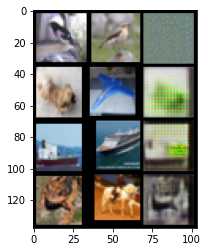

Testing - Epoch 0
overall - overall_loss = 0.4150943160057068
generator - g_loss = 0.00803195871412754
classifier - c_loss = 2.0433437824249268 acc = 0.235
Save best checkpoint with overall loss 0.4150943160057068 - g_loss 0.00803195871412754 - c_loss 2.0433437824249268


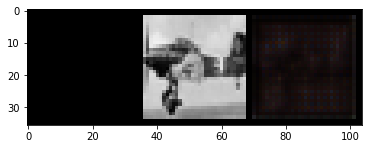

Training - Epoch 1
overall - overall_loss = 0.3883088529109955
generator - g_loss = 0.013923759572207928
classifier - c_loss = 1.8858503103256226 acc = 0.28904


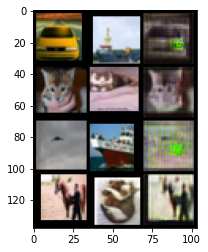

Testing - Epoch 1
overall - overall_loss = 0.363694429397583
generator - g_loss = 0.011004564352333546
classifier - c_loss = 1.7744535207748413 acc = 0.3452
Save best checkpoint with overall loss 0.363694429397583 - g_loss 0.011004564352333546 - c_loss 1.7744535207748413


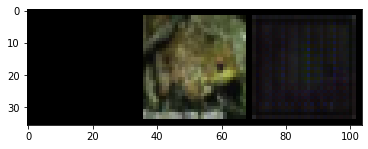

Training - Epoch 2
overall - overall_loss = 0.35434576869010925
generator - g_loss = 0.011865301057696342
classifier - c_loss = 1.7242666482925415 acc = 0.3568


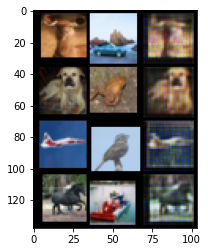

Testing - Epoch 2
overall - overall_loss = 0.3402809500694275
generator - g_loss = 0.007058600429445505
classifier - c_loss = 1.6731700897216797 acc = 0.3751
Save best checkpoint with overall loss 0.3402809500694275 - g_loss 0.007058600429445505 - c_loss 1.6731700897216797


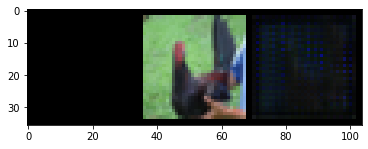

Training - Epoch 3
overall - overall_loss = 0.3356303572654724
generator - g_loss = 0.011010300368070602
classifier - c_loss = 1.6341099739074707 acc = 0.39304


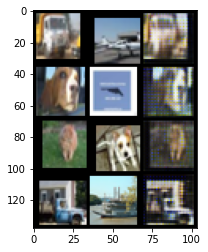

Testing - Epoch 3
overall - overall_loss = 0.35410967469215393
generator - g_loss = 0.011457647196948528
classifier - c_loss = 1.7247177362442017 acc = 0.3851


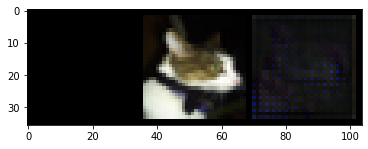

Training - Epoch 4
overall - overall_loss = 0.3216390013694763
generator - g_loss = 0.00977199524641037
classifier - c_loss = 1.5691074132919312 acc = 0.42524


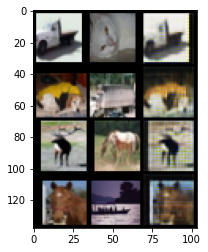

Testing - Epoch 4
overall - overall_loss = 0.3237461447715759
generator - g_loss = 0.01226211991161108
classifier - c_loss = 1.569682240486145 acc = 0.4391
Save best checkpoint with overall loss 0.3237461447715759 - g_loss 0.01226211991161108 - c_loss 1.569682240486145


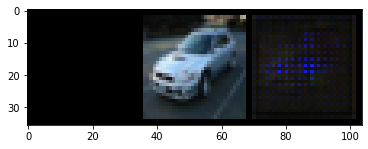

Training - Epoch 5
overall - overall_loss = 0.30969497561454773
generator - g_loss = 0.010106987319886684
classifier - c_loss = 1.5080466270446777 acc = 0.44404


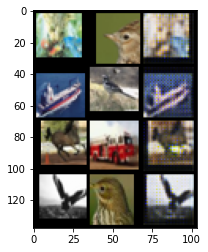

Testing - Epoch 5
overall - overall_loss = 0.29136914014816284
generator - g_loss = 0.004562798421829939
classifier - c_loss = 1.438594937324524 acc = 0.4758
Save best checkpoint with overall loss 0.29136914014816284 - g_loss 0.004562798421829939 - c_loss 1.438594937324524


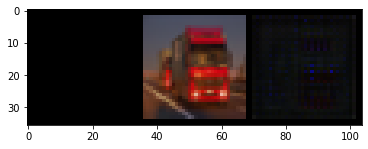

Training - Epoch 6
overall - overall_loss = 0.29988011717796326
generator - g_loss = 0.009344980120658875
classifier - c_loss = 1.4620201587677002 acc = 0.46356


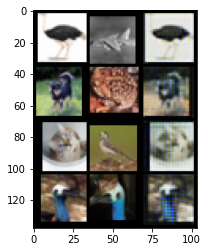

Testing - Epoch 6
overall - overall_loss = 0.27662959694862366
generator - g_loss = 0.006169312633574009
classifier - c_loss = 1.3584707975387573 acc = 0.5019
Save best checkpoint with overall loss 0.27662959694862366 - g_loss 0.006169312633574009 - c_loss 1.3584707975387573


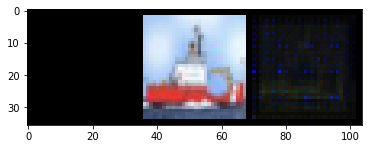

Training - Epoch 7
overall - overall_loss = 0.28800228238105774
generator - g_loss = 0.009244917891919613
classifier - c_loss = 1.4030314683914185 acc = 0.49152


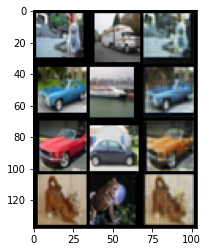

Testing - Epoch 7
overall - overall_loss = 0.31478744745254517
generator - g_loss = 0.0045967670157551765
classifier - c_loss = 1.5555500984191895 acc = 0.4495


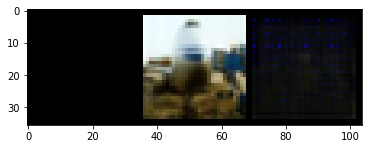

Training - Epoch 8
overall - overall_loss = 0.2824477553367615
generator - g_loss = 0.009732765145599842
classifier - c_loss = 1.3733075857162476 acc = 0.50148


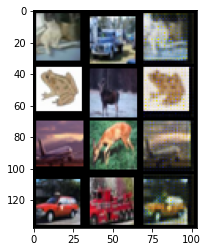

Testing - Epoch 8
overall - overall_loss = 0.2852787375450134
generator - g_loss = 0.0038529769517481327
classifier - c_loss = 1.4109817743301392 acc = 0.4907


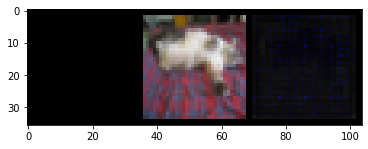

Training - Epoch 9
overall - overall_loss = 0.2718782126903534
generator - g_loss = 0.009528622962534428
classifier - c_loss = 1.3212770223617554 acc = 0.51964


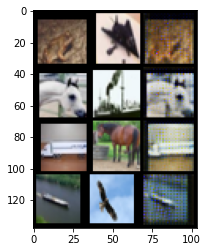

Testing - Epoch 9
overall - overall_loss = 0.27580440044403076
generator - g_loss = 0.0034715929068624973
classifier - c_loss = 1.3651357889175415 acc = 0.5251
Save best checkpoint with overall loss 0.27580440044403076 - g_loss 0.0034715929068624973 - c_loss 1.3651357889175415


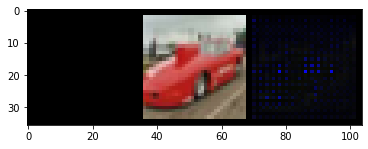

Training - Epoch 10
overall - overall_loss = 0.26451924443244934
generator - g_loss = 0.009883261285722256
classifier - c_loss = 1.2830640077590942 acc = 0.53636


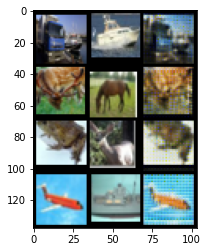

Testing - Epoch 10
overall - overall_loss = 0.2785073518753052
generator - g_loss = 0.005386613309383392
classifier - c_loss = 1.37099027633667 acc = 0.5206


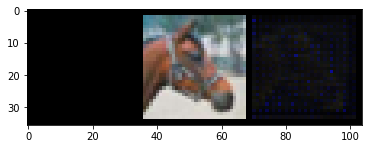

Training - Epoch 11
overall - overall_loss = 0.25614139437675476
generator - g_loss = 0.009896504692733288
classifier - c_loss = 1.241121530532837 acc = 0.55092


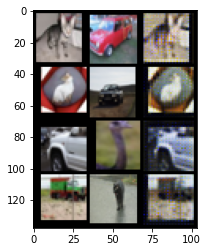

Testing - Epoch 11
overall - overall_loss = 0.23958641290664673
generator - g_loss = 0.0023354999721050262
classifier - c_loss = 1.1885900497436523 acc = 0.5742
Save best checkpoint with overall loss 0.23958641290664673 - g_loss 0.0023354999721050262 - c_loss 1.1885900497436523


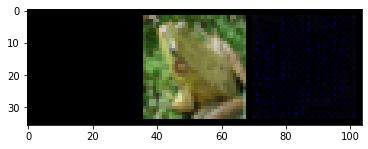

Training - Epoch 12
overall - overall_loss = 0.24698899686336517
generator - g_loss = 0.010449026711285114
classifier - c_loss = 1.1931476593017578 acc = 0.57152


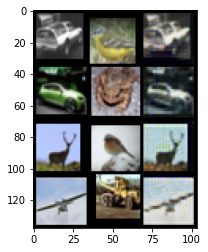

Testing - Epoch 12
overall - overall_loss = 0.2640921473503113
generator - g_loss = 0.00948620680719614
classifier - c_loss = 1.2825161218643188 acc = 0.5493


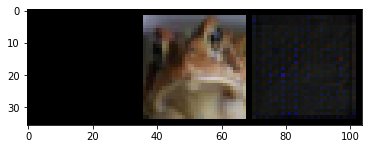

Training - Epoch 13
overall - overall_loss = 0.239531010389328
generator - g_loss = 0.01099246647208929
classifier - c_loss = 1.1536859273910522 acc = 0.58632


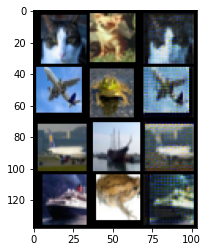

Testing - Epoch 13
overall - overall_loss = 0.24275220930576324
generator - g_loss = 0.004818187560886145
classifier - c_loss = 1.1944881677627563 acc = 0.5768


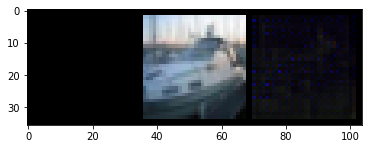

Training - Epoch 14
overall - overall_loss = 0.23092195391654968
generator - g_loss = 0.0113875987008214
classifier - c_loss = 1.1090586185455322 acc = 0.60364


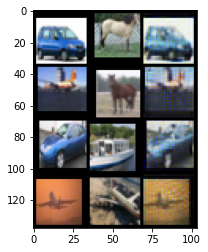

Testing - Epoch 14
overall - overall_loss = 0.26619717478752136
generator - g_loss = 0.012630091048777103
classifier - c_loss = 1.280465841293335 acc = 0.5647


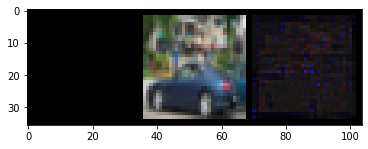

Training - Epoch 15
overall - overall_loss = 0.22248958051204681
generator - g_loss = 0.012084546498954296
classifier - c_loss = 1.0641095638275146 acc = 0.62004


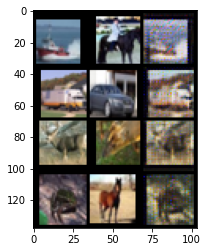

Testing - Epoch 15
overall - overall_loss = 0.22536812722682953
generator - g_loss = 0.011325480416417122
classifier - c_loss = 1.0815387964248657 acc = 0.6146
Save best checkpoint with overall loss 0.22536812722682953 - g_loss 0.011325480416417122 - c_loss 1.0815387964248657


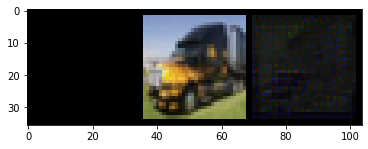

Training - Epoch 16
overall - overall_loss = 0.2143503725528717
generator - g_loss = 0.012160442769527435
classifier - c_loss = 1.023109793663025 acc = 0.63772


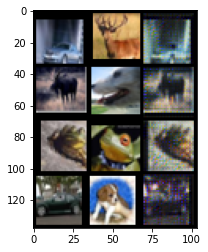

Testing - Epoch 16
overall - overall_loss = 0.21364377439022064
generator - g_loss = 0.011198158375918865
classifier - c_loss = 1.0234262943267822 acc = 0.639
Save best checkpoint with overall loss 0.21364377439022064 - g_loss 0.011198158375918865 - c_loss 1.0234262943267822


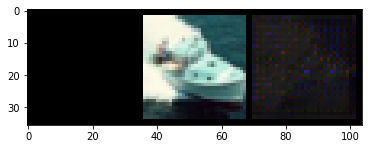

Training - Epoch 17
overall - overall_loss = 0.206647127866745
generator - g_loss = 0.012584589421749115
classifier - c_loss = 0.9828968644142151 acc = 0.6532


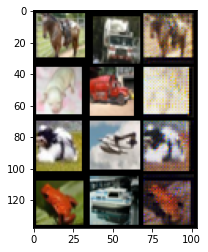

Testing - Epoch 17
overall - overall_loss = 0.2047094851732254
generator - g_loss = 0.009227193892002106
classifier - c_loss = 0.9866385459899902 acc = 0.65
Save best checkpoint with overall loss 0.2047094851732254 - g_loss 0.009227193892002106 - c_loss 0.9866385459899902


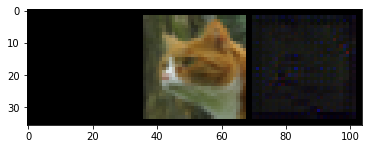

Training - Epoch 18
overall - overall_loss = 0.2007066160440445
generator - g_loss = 0.011726604774594307
classifier - c_loss = 0.9566263556480408 acc = 0.66096


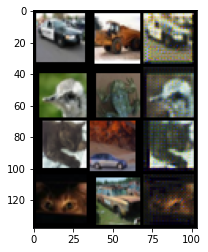

Testing - Epoch 18
overall - overall_loss = 0.2046334445476532
generator - g_loss = 0.010453318245708942
classifier - c_loss = 0.9813539981842041 acc = 0.6612
Save best checkpoint with overall loss 0.2046334445476532 - g_loss 0.010453318245708942 - c_loss 0.9813539981842041


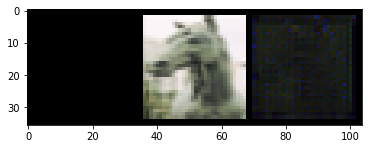

Training - Epoch 19
overall - overall_loss = 0.19086050987243652
generator - g_loss = 0.01225179061293602
classifier - c_loss = 0.9052954316139221 acc = 0.6784


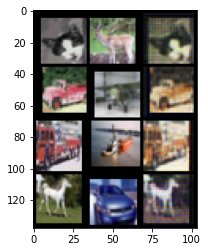

Testing - Epoch 19
overall - overall_loss = 0.18977314233779907
generator - g_loss = 0.010563479736447334
classifier - c_loss = 0.9066116809844971 acc = 0.6809
Save best checkpoint with overall loss 0.18977314233779907 - g_loss 0.010563479736447334 - c_loss 0.9066116809844971


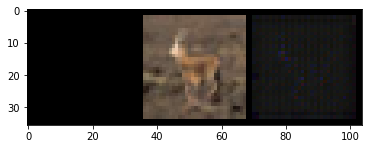

Training - Epoch 20
overall - overall_loss = 0.18525569140911102
generator - g_loss = 0.012067561969161034
classifier - c_loss = 0.8780081868171692 acc = 0.69012


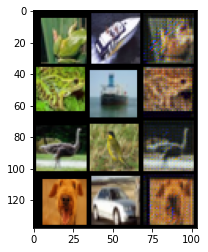

Testing - Epoch 20
overall - overall_loss = 0.18510377407073975
generator - g_loss = 0.011406372301280499
classifier - c_loss = 0.87989342212677 acc = 0.6907
Save best checkpoint with overall loss 0.18510377407073975 - g_loss 0.011406372301280499 - c_loss 0.87989342212677


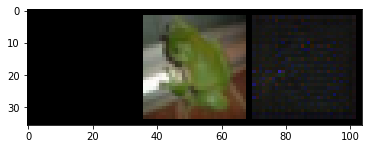

Training - Epoch 21
overall - overall_loss = 0.1808066964149475
generator - g_loss = 0.011509096249938011
classifier - c_loss = 0.8579971790313721 acc = 0.6968


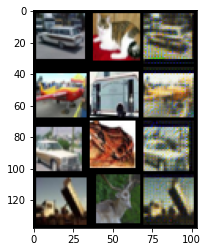

Testing - Epoch 21
overall - overall_loss = 0.1929972767829895
generator - g_loss = 0.013026873581111431
classifier - c_loss = 0.9128789901733398 acc = 0.6785


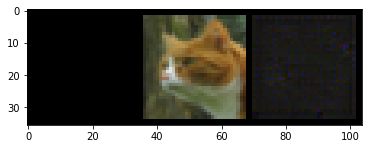

Training - Epoch 22
overall - overall_loss = 0.1778215616941452
generator - g_loss = 0.012001092545688152
classifier - c_loss = 0.8411034345626831 acc = 0.7048


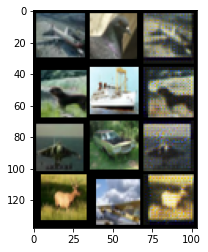

Testing - Epoch 22
overall - overall_loss = 0.17446845769882202
generator - g_loss = 0.011417620815336704
classifier - c_loss = 0.826671838760376 acc = 0.7124
Save best checkpoint with overall loss 0.17446845769882202 - g_loss 0.011417620815336704 - c_loss 0.826671838760376


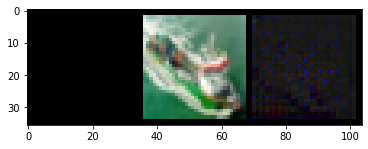

Training - Epoch 23
overall - overall_loss = 0.17224140465259552
generator - g_loss = 0.011882712133228779
classifier - c_loss = 0.8136757612228394 acc = 0.7112


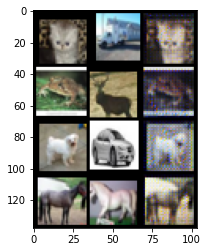

Testing - Epoch 23
overall - overall_loss = 0.18999406695365906
generator - g_loss = 0.010321893729269505
classifier - c_loss = 0.9086827039718628 acc = 0.6889


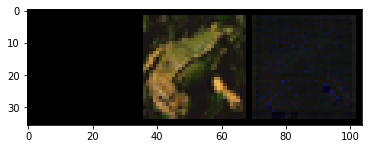

Training - Epoch 24
overall - overall_loss = 0.16949930787086487
generator - g_loss = 0.0114683136343956
classifier - c_loss = 0.8016231060028076 acc = 0.71928


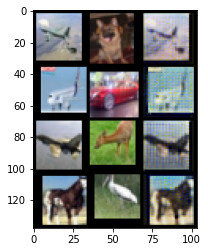

Testing - Epoch 24
overall - overall_loss = 0.1737355887889862
generator - g_loss = 0.007961416617035866
classifier - c_loss = 0.8368322849273682 acc = 0.7065
Save best checkpoint with overall loss 0.1737355887889862 - g_loss 0.007961416617035866 - c_loss 0.8368322849273682


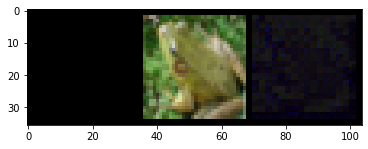

Training - Epoch 25
overall - overall_loss = 0.16435174643993378
generator - g_loss = 0.01155506819486618
classifier - c_loss = 0.7755385637283325 acc = 0.72564


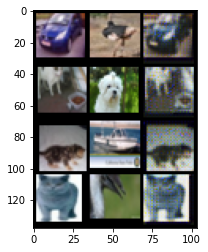

Testing - Epoch 25
overall - overall_loss = 0.17201903462409973
generator - g_loss = 0.010348103009164333
classifier - c_loss = 0.8187029957771301 acc = 0.7086
Save best checkpoint with overall loss 0.17201903462409973 - g_loss 0.010348103009164333 - c_loss 0.8187029957771301


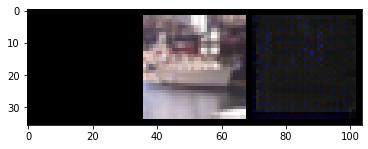

Training - Epoch 26
overall - overall_loss = 0.1600741744041443
generator - g_loss = 0.01077351812273264
classifier - c_loss = 0.7572770118713379 acc = 0.73308


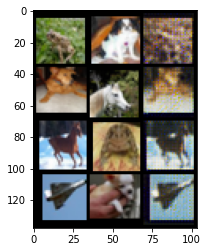

Testing - Epoch 26
overall - overall_loss = 0.16011062264442444
generator - g_loss = 0.00360742025077343
classifier - c_loss = 0.7861233353614807 acc = 0.7252
Save best checkpoint with overall loss 0.16011062264442444 - g_loss 0.00360742025077343 - c_loss 0.7861233353614807


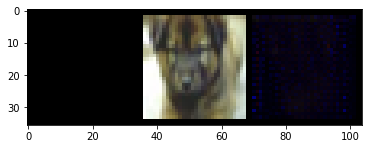

Training - Epoch 27
overall - overall_loss = 0.1584962159395218
generator - g_loss = 0.011299990117549896
classifier - c_loss = 0.7472810745239258 acc = 0.73712


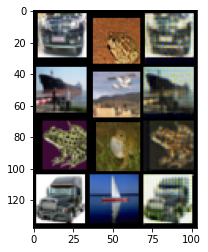

Testing - Epoch 27
overall - overall_loss = 0.1582723706960678
generator - g_loss = 0.010808607563376427
classifier - c_loss = 0.7481274604797363 acc = 0.7411
Save best checkpoint with overall loss 0.1582723706960678 - g_loss 0.010808607563376427 - c_loss 0.7481274604797363


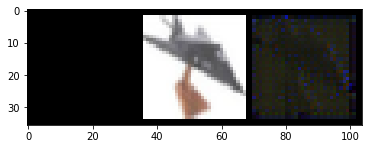

Training - Epoch 28
overall - overall_loss = 0.15524868667125702
generator - g_loss = 0.010891732759773731
classifier - c_loss = 0.7326763868331909 acc = 0.74012


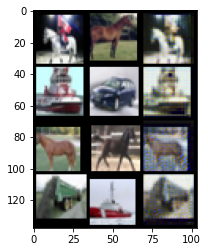

Testing - Epoch 28
overall - overall_loss = 0.1913861334323883
generator - g_loss = 0.008555371314287186
classifier - c_loss = 0.922709047794342 acc = 0.7011


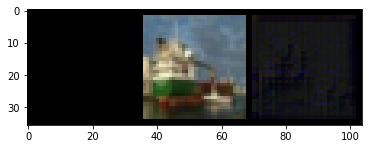

Training - Epoch 29
overall - overall_loss = 0.15364789962768555
generator - g_loss = 0.01071301568299532
classifier - c_loss = 0.7253875732421875 acc = 0.7462


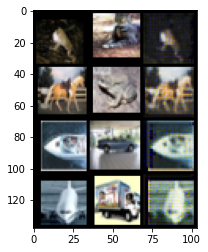

Testing - Epoch 29
overall - overall_loss = 0.15089882910251617
generator - g_loss = 0.004451047629117966
classifier - c_loss = 0.7366900444030762 acc = 0.7474
Save best checkpoint with overall loss 0.15089882910251617 - g_loss 0.004451047629117966 - c_loss 0.7366900444030762


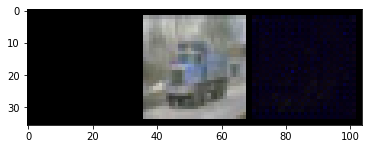

Training - Epoch 30
overall - overall_loss = 0.15038159489631653
generator - g_loss = 0.010440811514854431
classifier - c_loss = 0.7101443409919739 acc = 0.75088


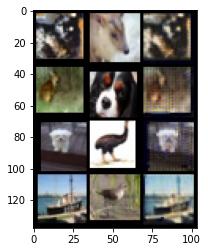

Testing - Epoch 30
overall - overall_loss = 0.15624307096004486
generator - g_loss = 0.005619650706648827
classifier - c_loss = 0.7587368488311768 acc = 0.7379


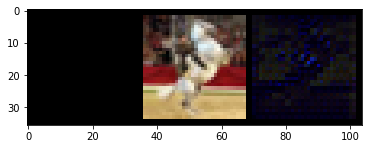

Training - Epoch 31
overall - overall_loss = 0.14834199845790863
generator - g_loss = 0.010867428965866566
classifier - c_loss = 0.6982402205467224 acc = 0.75204


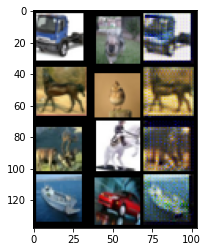

Testing - Epoch 31
overall - overall_loss = 0.14712262153625488
generator - g_loss = 0.0031917092856019735
classifier - c_loss = 0.722846269607544 acc = 0.7526
Save best checkpoint with overall loss 0.14712262153625488 - g_loss 0.0031917092856019735 - c_loss 0.722846269607544


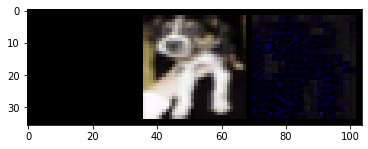

Training - Epoch 32
overall - overall_loss = 0.14494773745536804
generator - g_loss = 0.01081794872879982
classifier - c_loss = 0.6814675331115723 acc = 0.76312


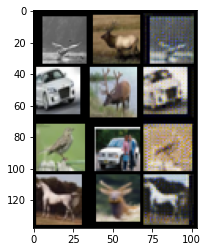

Testing - Epoch 32
overall - overall_loss = 0.14880457520484924
generator - g_loss = 0.010145195759832859
classifier - c_loss = 0.7034419178962708 acc = 0.7555


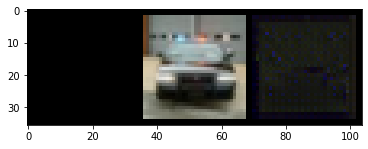

Training - Epoch 33
overall - overall_loss = 0.14103175699710846
generator - g_loss = 0.010774076916277409
classifier - c_loss = 0.6620621085166931 acc = 0.76788


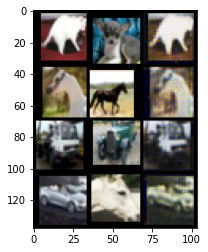

Testing - Epoch 33
overall - overall_loss = 0.1613580584526062
generator - g_loss = 0.004889505449682474
classifier - c_loss = 0.7872322797775269 acc = 0.7323


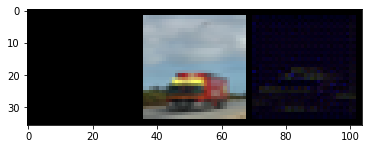

Training - Epoch 34
overall - overall_loss = 0.14059527218341827
generator - g_loss = 0.011094372719526291
classifier - c_loss = 0.6585989594459534 acc = 0.76936


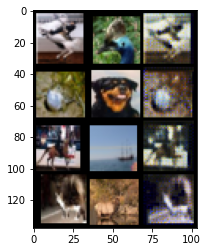

Testing - Epoch 34
overall - overall_loss = 0.15188105404376984
generator - g_loss = 0.008072827942669392
classifier - c_loss = 0.7271140217781067 acc = 0.7497


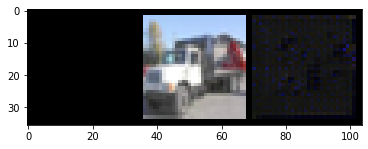

Training - Epoch 35
overall - overall_loss = 0.13993550837039948
generator - g_loss = 0.010524329729378223
classifier - c_loss = 0.657580554485321 acc = 0.76864


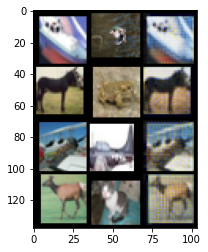

Testing - Epoch 35
overall - overall_loss = 0.16787832975387573
generator - g_loss = 0.0020007984712719917
classifier - c_loss = 0.8313884735107422 acc = 0.7101


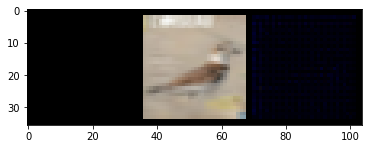

Training - Epoch 36
overall - overall_loss = 0.13403624296188354
generator - g_loss = 0.01077321544289589
classifier - c_loss = 0.627088725566864 acc = 0.77984


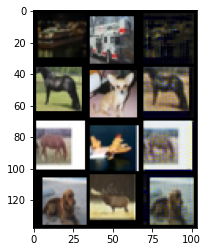

Testing - Epoch 36
overall - overall_loss = 0.14210930466651917
generator - g_loss = 0.004163064993917942
classifier - c_loss = 0.6938943862915039 acc = 0.76
Save best checkpoint with overall loss 0.14210930466651917 - g_loss 0.004163064993917942 - c_loss 0.6938943862915039


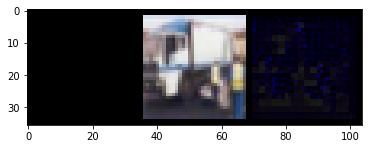

Training - Epoch 37
overall - overall_loss = 0.1351315677165985
generator - g_loss = 0.010776177980005741
classifier - c_loss = 0.6325531601905823 acc = 0.77624


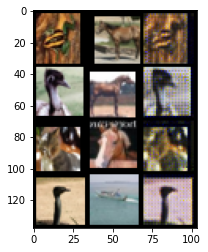

Testing - Epoch 37
overall - overall_loss = 0.14904536306858063
generator - g_loss = 0.006354521960020065
classifier - c_loss = 0.7198085784912109 acc = 0.7538


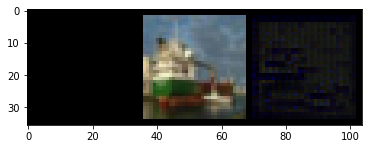

Training - Epoch 38
overall - overall_loss = 0.13079656660556793
generator - g_loss = 0.010590500198304653
classifier - c_loss = 0.6116204261779785 acc = 0.7856


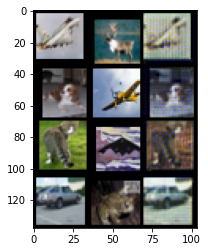

Testing - Epoch 38
overall - overall_loss = 0.14791588485240936
generator - g_loss = 0.012356370687484741
classifier - c_loss = 0.6901538968086243 acc = 0.7614


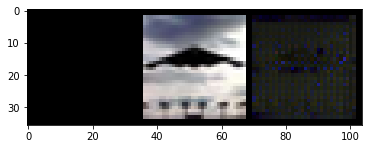

Training - Epoch 39
overall - overall_loss = 0.13218919932842255
generator - g_loss = 0.01084956619888544
classifier - c_loss = 0.6175479292869568 acc = 0.78432


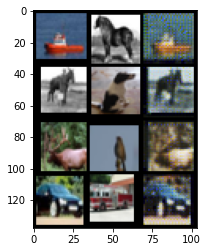

Testing - Epoch 39
overall - overall_loss = 0.14298374950885773
generator - g_loss = 0.008897007443010807
classifier - c_loss = 0.6793308854103088 acc = 0.7671


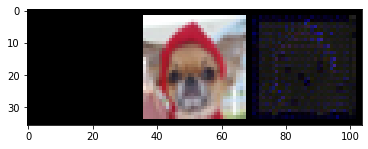

Training - Epoch 40
overall - overall_loss = 0.1276126205921173
generator - g_loss = 0.01024109497666359
classifier - c_loss = 0.5970986485481262 acc = 0.79064


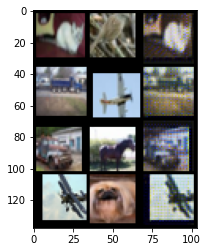

Testing - Epoch 40
overall - overall_loss = 0.13990940153598785
generator - g_loss = 0.001548427389934659
classifier - c_loss = 0.6933532953262329 acc = 0.7586
Save best checkpoint with overall loss 0.13990940153598785 - g_loss 0.001548427389934659 - c_loss 0.6933532953262329


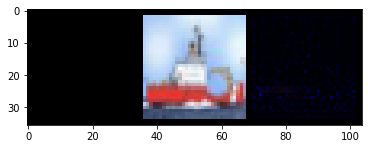

Training - Epoch 41
overall - overall_loss = 0.12493856251239777
generator - g_loss = 0.010565263219177723
classifier - c_loss = 0.5824316143989563 acc = 0.79244


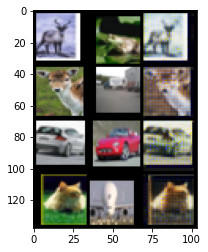

Testing - Epoch 41
overall - overall_loss = 0.1878591626882553
generator - g_loss = 0.005743897520005703
classifier - c_loss = 0.9163202047348022 acc = 0.714


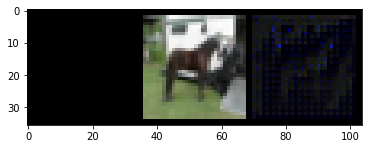

Training - Epoch 42
overall - overall_loss = 0.12549272179603577
generator - g_loss = 0.010469656437635422
classifier - c_loss = 0.585584819316864 acc = 0.79492


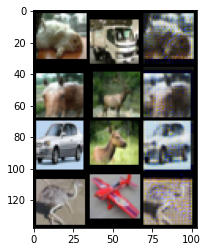

Testing - Epoch 42
overall - overall_loss = 0.15070800483226776
generator - g_loss = 0.004842199385166168
classifier - c_loss = 0.7341712117195129 acc = 0.7514


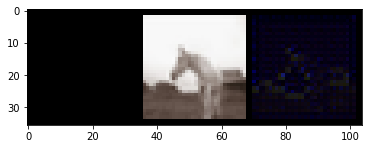

Training - Epoch 43
overall - overall_loss = 0.1231192946434021
generator - g_loss = 0.010309435427188873
classifier - c_loss = 0.5743585228919983 acc = 0.80044


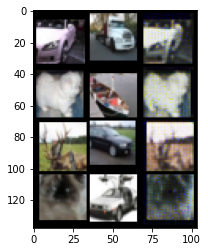

Testing - Epoch 43
overall - overall_loss = 0.13740544021129608
generator - g_loss = 0.0016017808811739087
classifier - c_loss = 0.6806198358535767 acc = 0.7611
Save best checkpoint with overall loss 0.13740544021129608 - g_loss 0.0016017808811739087 - c_loss 0.6806198358535767


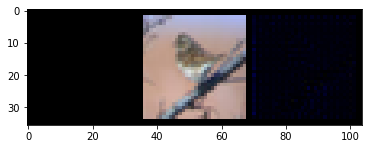

Training - Epoch 44
overall - overall_loss = 0.12008852511644363
generator - g_loss = 0.010310140438377857
classifier - c_loss = 0.5592021942138672 acc = 0.8026


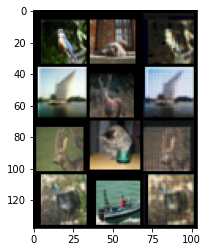

Testing - Epoch 44
overall - overall_loss = 0.13628454506397247
generator - g_loss = 0.005476989317685366
classifier - c_loss = 0.6595145463943481 acc = 0.7714
Save best checkpoint with overall loss 0.13628454506397247 - g_loss 0.005476989317685366 - c_loss 0.6595145463943481


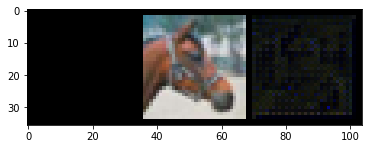

Training - Epoch 45
overall - overall_loss = 0.11926616728305817
generator - g_loss = 0.010721973143517971
classifier - c_loss = 0.5534429550170898 acc = 0.80772


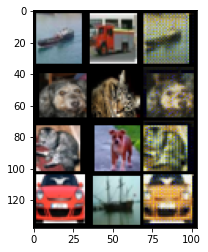

Testing - Epoch 45
overall - overall_loss = 0.15934312343597412
generator - g_loss = 0.004075207281857729
classifier - c_loss = 0.7804148197174072 acc = 0.7462


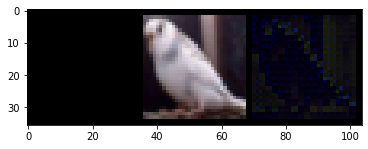

Training - Epoch 46
overall - overall_loss = 0.11736304312944412
generator - g_loss = 0.01061664056032896
classifier - c_loss = 0.5443488359451294 acc = 0.80848


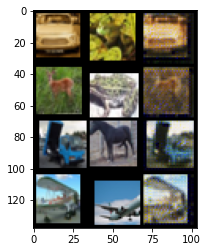

Testing - Epoch 46
overall - overall_loss = 0.13973180949687958
generator - g_loss = 0.009739479050040245
classifier - c_loss = 0.6597012281417847 acc = 0.7748


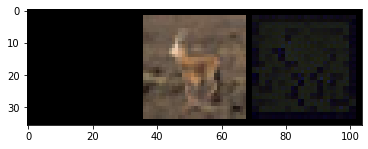

Training - Epoch 47
overall - overall_loss = 0.11569048464298248
generator - g_loss = 0.010212034918367863
classifier - c_loss = 0.5376045107841492 acc = 0.81


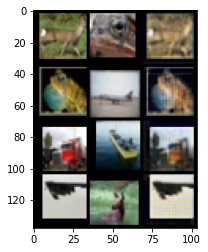

Testing - Epoch 47
overall - overall_loss = 0.13418881595134735
generator - g_loss = 0.006482525262981653
classifier - c_loss = 0.6450139284133911 acc = 0.7849
Save best checkpoint with overall loss 0.13418881595134735 - g_loss 0.006482525262981653 - c_loss 0.6450139284133911


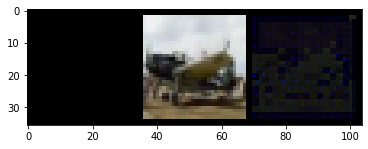

Training - Epoch 48
overall - overall_loss = 0.11682455986738205
generator - g_loss = 0.010480556637048721
classifier - c_loss = 0.5422008037567139 acc = 0.80776


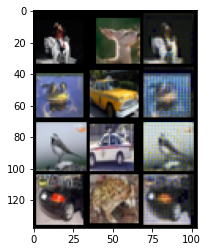

Testing - Epoch 48
overall - overall_loss = 0.13648822903633118
generator - g_loss = 0.009469220414757729
classifier - c_loss = 0.644564151763916 acc = 0.7783


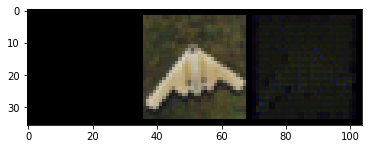

Training - Epoch 49
overall - overall_loss = 0.11382614076137543
generator - g_loss = 0.01030047982931137
classifier - c_loss = 0.5279288291931152 acc = 0.8158


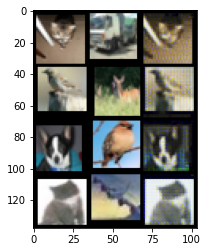

Testing - Epoch 49
overall - overall_loss = 0.13131116330623627
generator - g_loss = 0.008634605444967747
classifier - c_loss = 0.6220173835754395 acc = 0.7898
Save best checkpoint with overall loss 0.13131116330623627 - g_loss 0.008634605444967747 - c_loss 0.6220173835754395


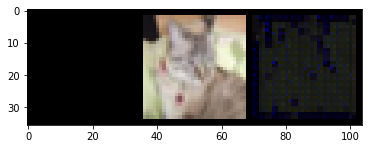

Training - Epoch 50
overall - overall_loss = 0.10969576984643936
generator - g_loss = 0.010207919403910637
classifier - c_loss = 0.507646918296814 acc = 0.82248


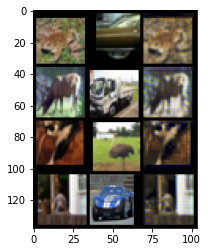

Testing - Epoch 50
overall - overall_loss = 0.13833214342594147
generator - g_loss = 0.0031258086673915386
classifier - c_loss = 0.6791573762893677 acc = 0.7761


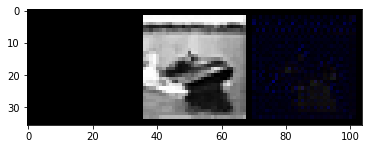

Training - Epoch 51
overall - overall_loss = 0.11063472181558609
generator - g_loss = 0.009903513826429844
classifier - c_loss = 0.5135599374771118 acc = 0.8222


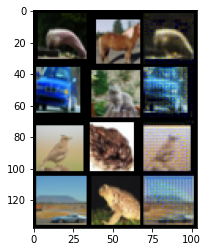

Testing - Epoch 51
overall - overall_loss = 0.13715653121471405
generator - g_loss = 0.009298119693994522
classifier - c_loss = 0.6485902667045593 acc = 0.7849


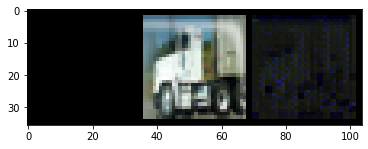

Training - Epoch 52
overall - overall_loss = 0.10878927260637283
generator - g_loss = 0.010256398469209671
classifier - c_loss = 0.502920389175415 acc = 0.82228


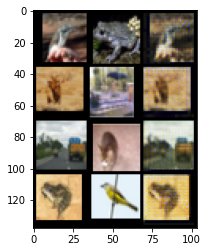

Testing - Epoch 52
overall - overall_loss = 0.1287645846605301
generator - g_loss = 0.0037439384032040834
classifier - c_loss = 0.6288473010063171 acc = 0.7897
Save best checkpoint with overall loss 0.1287645846605301 - g_loss 0.0037439384032040834 - c_loss 0.6288473010063171


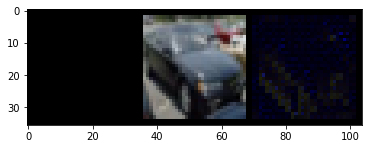

Training - Epoch 53
overall - overall_loss = 0.10654406994581223
generator - g_loss = 0.009835117496550083
classifier - c_loss = 0.4933798015117645 acc = 0.82632


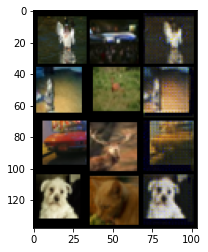

Testing - Epoch 53
overall - overall_loss = 0.16243988275527954
generator - g_loss = 0.006276301108300686
classifier - c_loss = 0.7870941758155823 acc = 0.7511


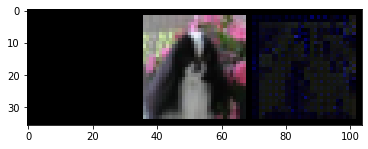

Training - Epoch 54
overall - overall_loss = 0.10539352893829346
generator - g_loss = 0.010212923400104046
classifier - c_loss = 0.4861156940460205 acc = 0.829


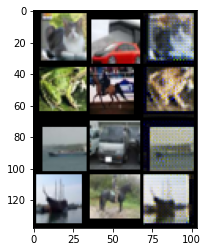

Testing - Epoch 54
overall - overall_loss = 0.14501847326755524
generator - g_loss = 0.013034350238740444
classifier - c_loss = 0.6729550957679749 acc = 0.7783


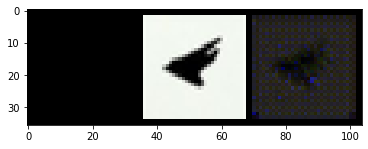

Training - Epoch 55
overall - overall_loss = 0.10567605495452881
generator - g_loss = 0.010339540429413319
classifier - c_loss = 0.4870220720767975 acc = 0.82692


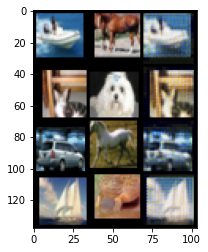

Testing - Epoch 55
overall - overall_loss = 0.1290382742881775
generator - g_loss = 0.0059916614554822445
classifier - c_loss = 0.6212247610092163 acc = 0.7894


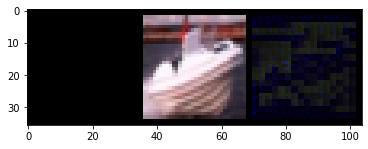

Training - Epoch 56
overall - overall_loss = 0.10408540070056915
generator - g_loss = 0.010267741046845913
classifier - c_loss = 0.4793558418750763 acc = 0.8312


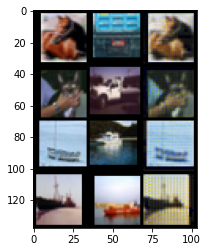

Testing - Epoch 56
overall - overall_loss = 0.13112033903598785
generator - g_loss = 0.004466106649488211
classifier - c_loss = 0.6377373933792114 acc = 0.7899


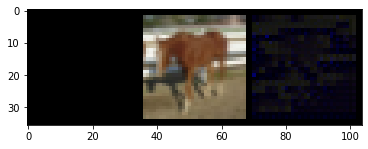

Training - Epoch 57
overall - overall_loss = 0.10686718672513962
generator - g_loss = 0.012071821838617325
classifier - c_loss = 0.4860484302043915 acc = 0.82992


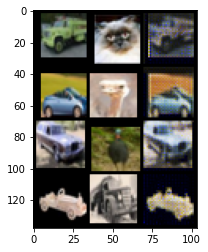

Testing - Epoch 57
overall - overall_loss = 0.13009802997112274
generator - g_loss = 0.004555308725684881
classifier - c_loss = 0.6322689652442932 acc = 0.7909


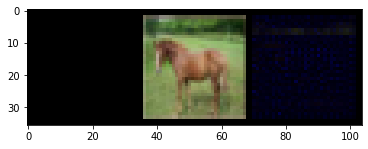

Training - Epoch 58
overall - overall_loss = 0.10106124728918076
generator - g_loss = 0.009953564032912254
classifier - c_loss = 0.4654920697212219 acc = 0.83544


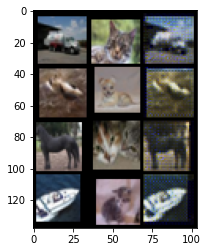

Testing - Epoch 58
overall - overall_loss = 0.15059764683246613
generator - g_loss = 0.008406606502830982
classifier - c_loss = 0.7193619608879089 acc = 0.7663


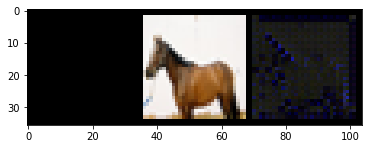

Training - Epoch 59
overall - overall_loss = 0.09983476996421814
generator - g_loss = 0.009718440473079681
classifier - c_loss = 0.4603002667427063 acc = 0.83588


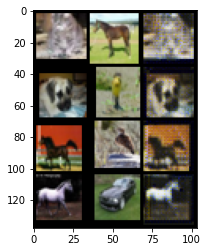

Testing - Epoch 59
overall - overall_loss = 0.1432608664035797
generator - g_loss = 0.00643204478546977
classifier - c_loss = 0.6905760765075684 acc = 0.7797


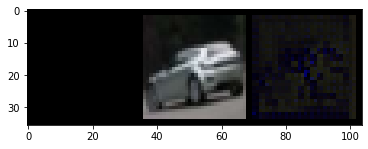

Training - Epoch 60
overall - overall_loss = 0.09972937405109406
generator - g_loss = 0.009830138646066189
classifier - c_loss = 0.4593266248703003 acc = 0.8372


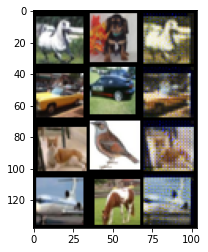

Testing - Epoch 60
overall - overall_loss = 0.12999175488948822
generator - g_loss = 0.00942536722868681
classifier - c_loss = 0.612257182598114 acc = 0.7956


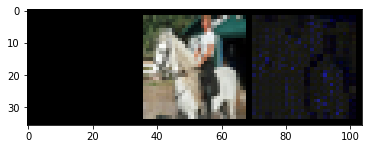

Training - Epoch 61
overall - overall_loss = 0.09836167842149734
generator - g_loss = 0.00988234393298626
classifier - c_loss = 0.45227885246276855 acc = 0.84136


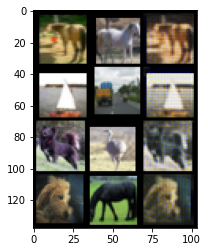

Testing - Epoch 61
overall - overall_loss = 0.1375478357076645
generator - g_loss = 0.004480279050767422
classifier - c_loss = 0.6698180437088013 acc = 0.7856


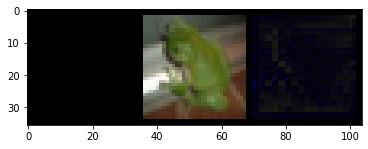

Training - Epoch 62
overall - overall_loss = 0.09400322288274765
generator - g_loss = 0.009664252400398254
classifier - c_loss = 0.4313594102859497 acc = 0.84888


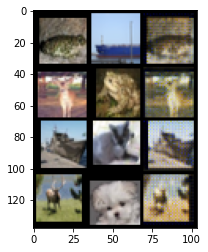

Testing - Epoch 62
overall - overall_loss = 0.1320025771856308
generator - g_loss = 0.005217930302023888
classifier - c_loss = 0.6391411423683167 acc = 0.7921


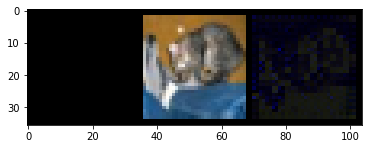

Training - Epoch 63
overall - overall_loss = 0.09441269189119339
generator - g_loss = 0.009967312216758728
classifier - c_loss = 0.4321940541267395 acc = 0.84848


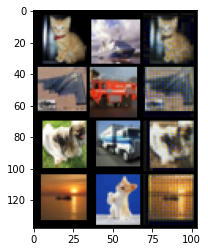

Testing - Epoch 63
overall - overall_loss = 0.1325567662715912
generator - g_loss = 0.009802530519664288
classifier - c_loss = 0.6235737204551697 acc = 0.7988


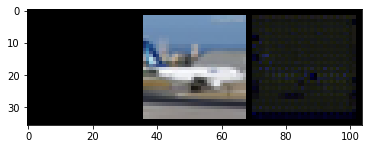

Training - Epoch 64
overall - overall_loss = 0.0943058580160141
generator - g_loss = 0.010157311335206032
classifier - c_loss = 0.4308999478816986 acc = 0.84648


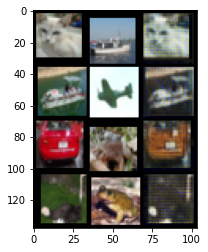

Testing - Epoch 64
overall - overall_loss = 0.14215126633644104
generator - g_loss = 0.009592539630830288
classifier - c_loss = 0.6723860502243042 acc = 0.7878


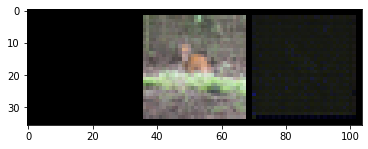

Training - Epoch 65
overall - overall_loss = 0.09320446848869324
generator - g_loss = 0.010095899924635887
classifier - c_loss = 0.4256385862827301 acc = 0.84996


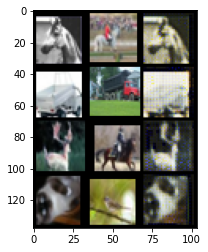

Testing - Epoch 65
overall - overall_loss = 0.14086347818374634
generator - g_loss = 0.0055403197184205055
classifier - c_loss = 0.6821561455726624 acc = 0.7842


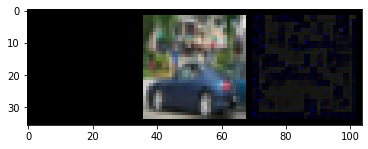

Training - Epoch 66
overall - overall_loss = 0.09107779711484909
generator - g_loss = 0.00987374596297741
classifier - c_loss = 0.41589412093162537 acc = 0.85388


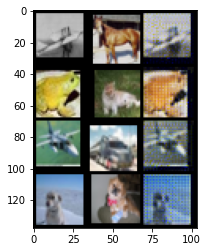

Testing - Epoch 66
overall - overall_loss = 0.1385892778635025
generator - g_loss = 0.006845185067504644
classifier - c_loss = 0.6655656695365906 acc = 0.7973


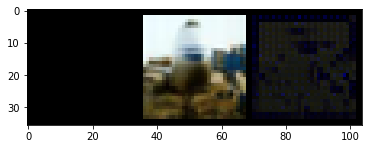

Training - Epoch 67
overall - overall_loss = 0.09010948985815048
generator - g_loss = 0.010428294539451599
classifier - c_loss = 0.4088340103626251 acc = 0.85508


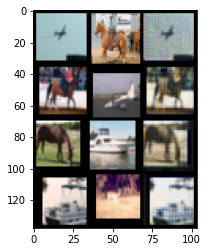

Testing - Epoch 67
overall - overall_loss = 0.12254584580659866
generator - g_loss = 0.0025275549851357937
classifier - c_loss = 0.6026187539100647 acc = 0.8029
Save best checkpoint with overall loss 0.12254584580659866 - g_loss 0.0025275549851357937 - c_loss 0.6026187539100647


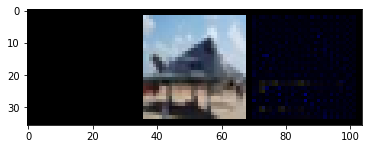

Training - Epoch 68
overall - overall_loss = 0.08862641453742981
generator - g_loss = 0.009898615069687366
classifier - c_loss = 0.40353748202323914 acc = 0.8582


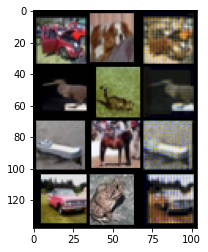

Testing - Epoch 68
overall - overall_loss = 0.13104073703289032
generator - g_loss = 0.006825865712016821
classifier - c_loss = 0.6279001235961914 acc = 0.8


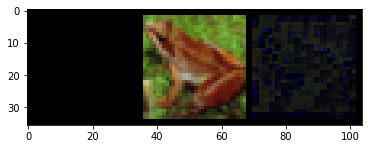

Training - Epoch 69
overall - overall_loss = 0.08937782794237137
generator - g_loss = 0.01001063548028469
classifier - c_loss = 0.40684664249420166 acc = 0.85628


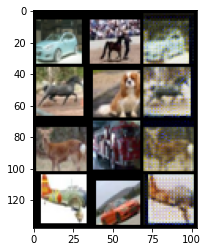

Testing - Epoch 69
overall - overall_loss = 0.1347760409116745
generator - g_loss = 0.0016777663258835673
classifier - c_loss = 0.6671690940856934 acc = 0.7907


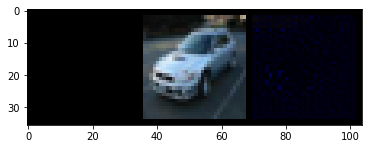

Training - Epoch 70
overall - overall_loss = 0.08955075591802597
generator - g_loss = 0.01048454362899065
classifier - c_loss = 0.4058154225349426 acc = 0.85784


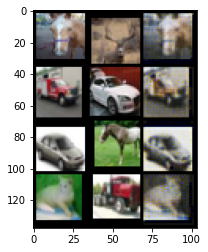

Testing - Epoch 70
overall - overall_loss = 0.13340362906455994
generator - g_loss = 0.007442236877977848
classifier - c_loss = 0.637249231338501 acc = 0.7927


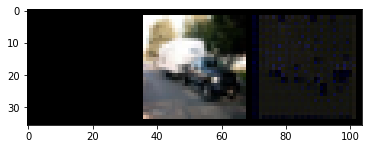

Training - Epoch 71
overall - overall_loss = 0.08580324053764343
generator - g_loss = 0.009821215644478798
classifier - c_loss = 0.3897312879562378 acc = 0.86116


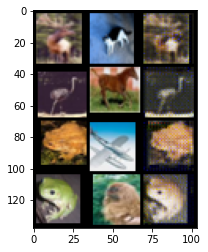

Testing - Epoch 71
overall - overall_loss = 0.12053904682397842
generator - g_loss = 0.002518224995583296
classifier - c_loss = 0.5926223397254944 acc = 0.8091
Save best checkpoint with overall loss 0.12053904682397842 - g_loss 0.002518224995583296 - c_loss 0.5926223397254944


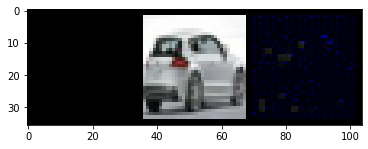

Training - Epoch 72
overall - overall_loss = 0.0860561728477478
generator - g_loss = 0.01027896348387003
classifier - c_loss = 0.3891651928424835 acc = 0.86204


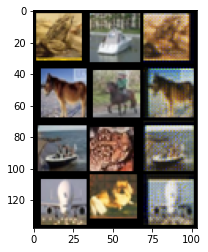

Testing - Epoch 72
overall - overall_loss = 0.13481776416301727
generator - g_loss = 0.0034590067807585
classifier - c_loss = 0.6602526903152466 acc = 0.7923


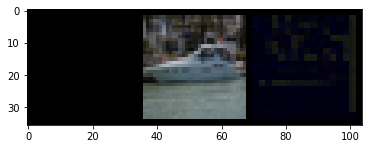

Training - Epoch 73
overall - overall_loss = 0.08349701017141342
generator - g_loss = 0.009845813736319542
classifier - c_loss = 0.3781016170978546 acc = 0.86836


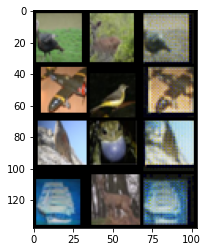

Testing - Epoch 73
overall - overall_loss = 0.1264352649450302
generator - g_loss = 0.0019249246688559651
classifier - c_loss = 0.6244766116142273 acc = 0.8002


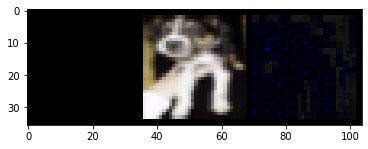

Training - Epoch 74
overall - overall_loss = 0.08451248705387115
generator - g_loss = 0.010273553431034088
classifier - c_loss = 0.3814680278301239 acc = 0.86308


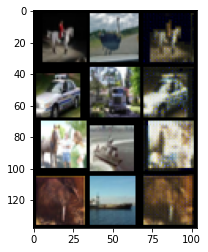

Testing - Epoch 74
overall - overall_loss = 0.12608282268047333
generator - g_loss = 0.004807349760085344
classifier - c_loss = 0.6111847758293152 acc = 0.8089


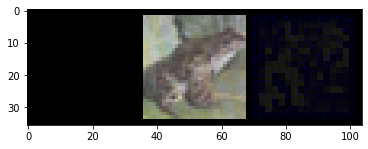

Training - Epoch 75
overall - overall_loss = 0.08355902880430222
generator - g_loss = 0.010171936824917793
classifier - c_loss = 0.3771074116230011 acc = 0.86684


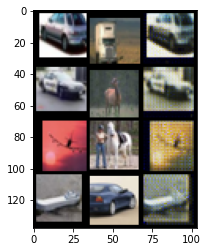

Testing - Epoch 75
overall - overall_loss = 0.13481828570365906
generator - g_loss = 0.010535506531596184
classifier - c_loss = 0.6319494247436523 acc = 0.8053


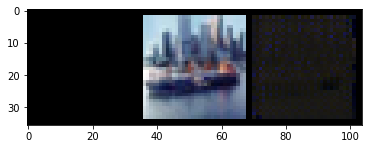

Training - Epoch 76
overall - overall_loss = 0.08221972733736038
generator - g_loss = 0.01005459949374199
classifier - c_loss = 0.37088003754615784 acc = 0.8688


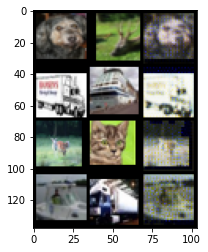

Testing - Epoch 76
overall - overall_loss = 0.12539051473140717
generator - g_loss = 0.0028266545850783587
classifier - c_loss = 0.6156460642814636 acc = 0.8071


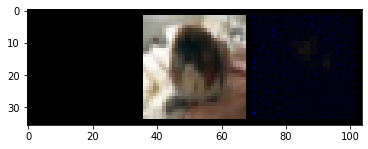

Training - Epoch 77
overall - overall_loss = 0.08132859319448471
generator - g_loss = 0.010050071403384209
classifier - c_loss = 0.3664427697658539 acc = 0.87308


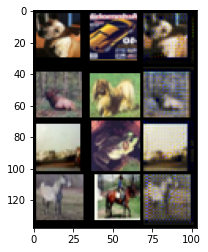

Testing - Epoch 77
overall - overall_loss = 0.12681810557842255
generator - g_loss = 0.004883087705820799
classifier - c_loss = 0.6145580410957336 acc = 0.8048


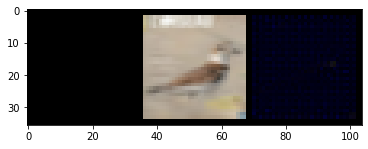

Training - Epoch 78
overall - overall_loss = 0.08090720325708389
generator - g_loss = 0.009934237226843834
classifier - c_loss = 0.3647992014884949 acc = 0.87064


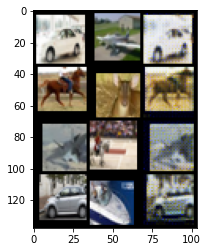

Testing - Epoch 78
overall - overall_loss = 0.13333013653755188
generator - g_loss = 0.001951908809132874
classifier - c_loss = 0.6588431000709534 acc = 0.7983


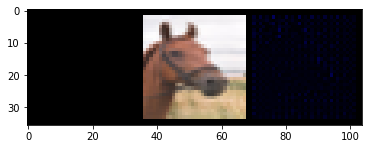

Training - Epoch 79
overall - overall_loss = 0.07852847874164581
generator - g_loss = 0.009489730931818485
classifier - c_loss = 0.3546837270259857 acc = 0.876


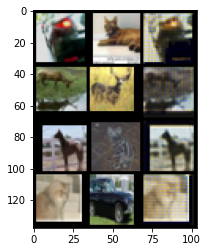

Testing - Epoch 79
overall - overall_loss = 0.1330721378326416
generator - g_loss = 0.003372596576809883
classifier - c_loss = 0.6518703103065491 acc = 0.8025


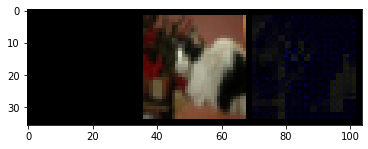

Training - Epoch 80
overall - overall_loss = 0.07980804890394211
generator - g_loss = 0.010163942351937294
classifier - c_loss = 0.35838428139686584 acc = 0.8728


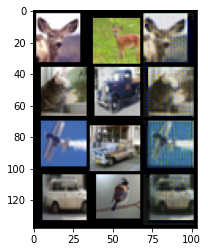

Testing - Epoch 80
overall - overall_loss = 0.13387513160705566
generator - g_loss = 0.0035110919270664454
classifier - c_loss = 0.6553313732147217 acc = 0.8002


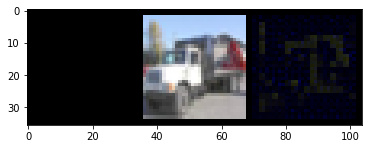

Training - Epoch 81
overall - overall_loss = 0.0776171088218689
generator - g_loss = 0.010478568263351917
classifier - c_loss = 0.34617146849632263 acc = 0.87788


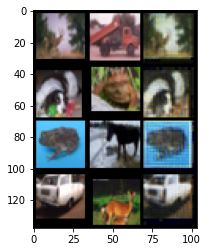

Testing - Epoch 81
overall - overall_loss = 0.13404865562915802
generator - g_loss = 0.00246919016353786
classifier - c_loss = 0.6603664755821228 acc = 0.8007


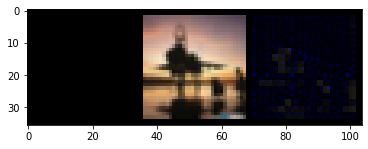

Training - Epoch 82
overall - overall_loss = 0.07611894607543945
generator - g_loss = 0.0108340410515666
classifier - c_loss = 0.33725863695144653 acc = 0.87988


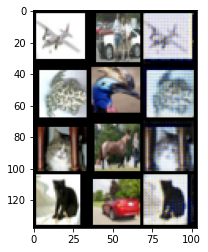

Testing - Epoch 82
overall - overall_loss = 0.13104531168937683
generator - g_loss = 0.002222341950982809
classifier - c_loss = 0.6463373303413391 acc = 0.8045


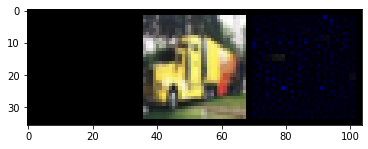

Training - Epoch 83
overall - overall_loss = 0.0761917307972908
generator - g_loss = 0.01039130985736847
classifier - c_loss = 0.3393932282924652 acc = 0.87944


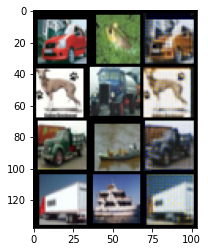

Testing - Epoch 83
overall - overall_loss = 0.13911880552768707
generator - g_loss = 0.009292075410485268
classifier - c_loss = 0.6584256887435913 acc = 0.8049


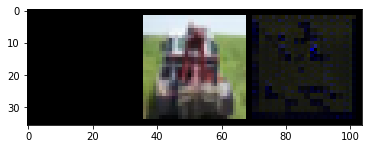

Training - Epoch 84
overall - overall_loss = 0.07460104674100876
generator - g_loss = 0.010338964872062206
classifier - c_loss = 0.3316493630409241 acc = 0.88372


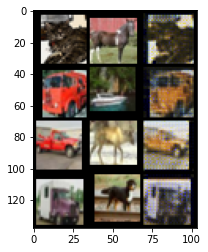

Testing - Epoch 84
overall - overall_loss = 0.13404147326946259
generator - g_loss = 0.0027011570055037737
classifier - c_loss = 0.6594026684761047 acc = 0.7973


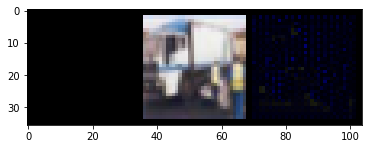

Training - Epoch 85
overall - overall_loss = 0.07386235892772675
generator - g_loss = 0.009962319396436214
classifier - c_loss = 0.32946255803108215 acc = 0.88448


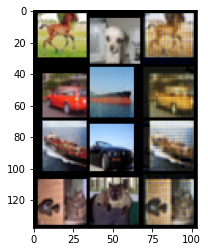

Testing - Epoch 85
overall - overall_loss = 0.14875611662864685
generator - g_loss = 0.007866570726037025
classifier - c_loss = 0.712314248085022 acc = 0.7924


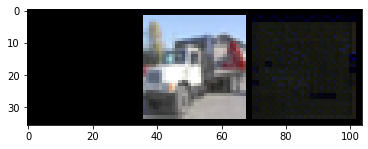

Training - Epoch 86
overall - overall_loss = 0.07429938018321991
generator - g_loss = 0.009975498542189598
classifier - c_loss = 0.33159488439559937 acc = 0.88176


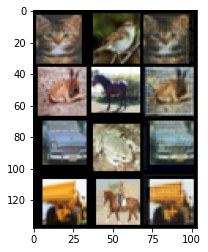

Testing - Epoch 86
overall - overall_loss = 0.12962917983531952
generator - g_loss = 0.0030942829325795174
classifier - c_loss = 0.6357688903808594 acc = 0.8061


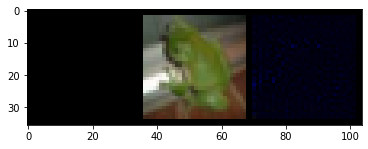

Training - Epoch 87
overall - overall_loss = 0.07075492292642593
generator - g_loss = 0.010093040764331818
classifier - c_loss = 0.3134025037288666 acc = 0.88984


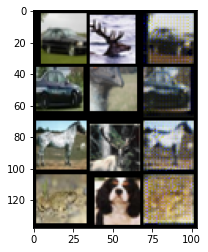

Testing - Epoch 87
overall - overall_loss = 0.12704245746135712
generator - g_loss = 0.004633091855794191
classifier - c_loss = 0.6166800260543823 acc = 0.8137


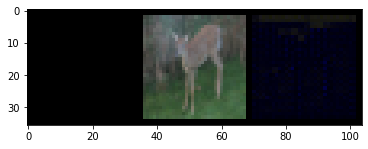

Training - Epoch 88
overall - overall_loss = 0.07356647402048111
generator - g_loss = 0.010447205975651741
classifier - c_loss = 0.3260434567928314 acc = 0.88568


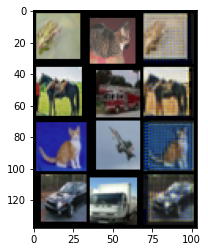

Testing - Epoch 88
overall - overall_loss = 0.13357165455818176
generator - g_loss = 0.008811099454760551
classifier - c_loss = 0.6326137781143188 acc = 0.8119


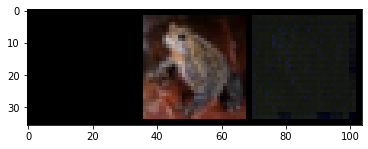

Training - Epoch 89
overall - overall_loss = 0.07072462886571884
generator - g_loss = 0.010239867493510246
classifier - c_loss = 0.3126634657382965 acc = 0.88784


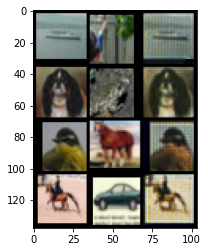

Testing - Epoch 89
overall - overall_loss = 0.12630508840084076
generator - g_loss = 0.006818447727710009
classifier - c_loss = 0.6042515635490417 acc = 0.8114


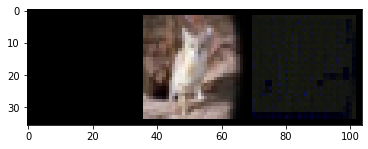

Training - Epoch 90
overall - overall_loss = 0.07004686444997787
generator - g_loss = 0.00986613892018795
classifier - c_loss = 0.31076979637145996 acc = 0.89076


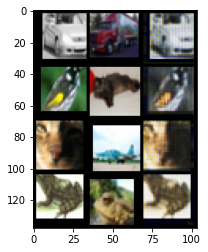

Testing - Epoch 90
overall - overall_loss = 0.14593517780303955
generator - g_loss = 0.009462115354835987
classifier - c_loss = 0.6918274164199829 acc = 0.7986


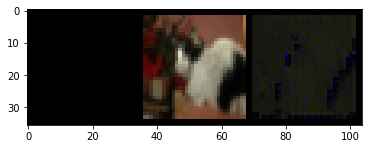

Training - Epoch 91
overall - overall_loss = 0.06973101198673248
generator - g_loss = 0.010730735957622528
classifier - c_loss = 0.30573198199272156 acc = 0.89172


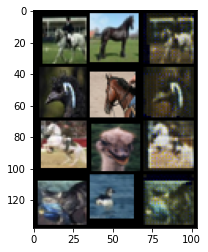

Testing - Epoch 91
overall - overall_loss = 0.1403907984495163
generator - g_loss = 0.00367109221406281
classifier - c_loss = 0.6872695684432983 acc = 0.7971


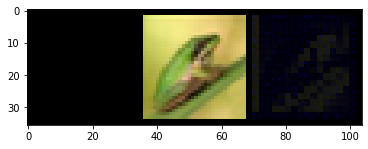

Training - Epoch 92
overall - overall_loss = 0.06920439004898071
generator - g_loss = 0.010117657482624054
classifier - c_loss = 0.3055512309074402 acc = 0.89076


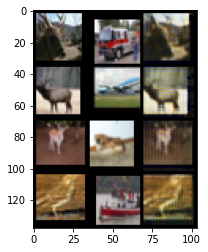

Testing - Epoch 92
overall - overall_loss = 0.1611270010471344
generator - g_loss = 0.009923969395458698
classifier - c_loss = 0.7659390568733215 acc = 0.7694


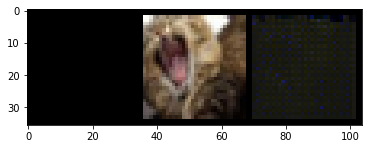

Training - Epoch 93
overall - overall_loss = 0.06773991882801056
generator - g_loss = 0.01001434214413166
classifier - c_loss = 0.2986421585083008 acc = 0.89372


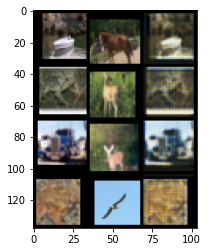

Testing - Epoch 93
overall - overall_loss = 0.13201504945755005
generator - g_loss = 0.0060881152749061584
classifier - c_loss = 0.635722815990448 acc = 0.8149


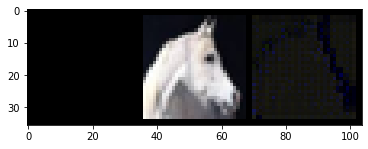

Training - Epoch 94
overall - overall_loss = 0.06820785999298096
generator - g_loss = 0.010750211775302887
classifier - c_loss = 0.2980383038520813 acc = 0.8938


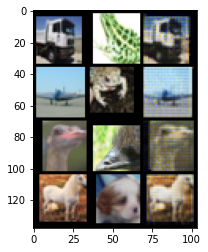

Testing - Epoch 94
overall - overall_loss = 0.13888832926750183
generator - g_loss = 0.008988170884549618
classifier - c_loss = 0.6584887504577637 acc = 0.8141


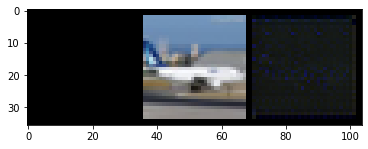

Training - Epoch 95
overall - overall_loss = 0.06683723628520966
generator - g_loss = 0.010243186727166176
classifier - c_loss = 0.2932133376598358 acc = 0.89648


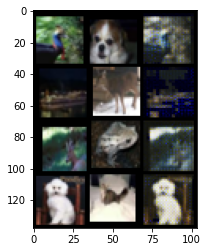

Testing - Epoch 95
overall - overall_loss = 0.14537759125232697
generator - g_loss = 0.004781477153301239
classifier - c_loss = 0.7077618837356567 acc = 0.797


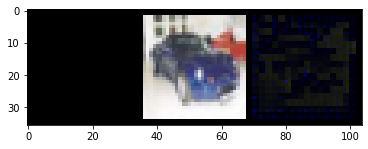

Training - Epoch 96
overall - overall_loss = 0.06592383980751038
generator - g_loss = 0.009994369931519032
classifier - c_loss = 0.28964173793792725 acc = 0.8964


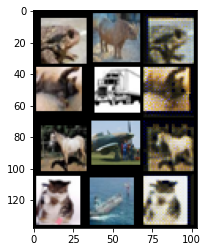

Testing - Epoch 96
overall - overall_loss = 0.13126608729362488
generator - g_loss = 0.0029174163937568665
classifier - c_loss = 0.6446608304977417 acc = 0.8107


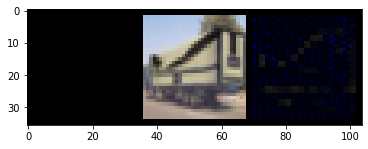

Training - Epoch 97
overall - overall_loss = 0.06618943810462952
generator - g_loss = 0.009883986786007881
classifier - c_loss = 0.29141107201576233 acc = 0.89856


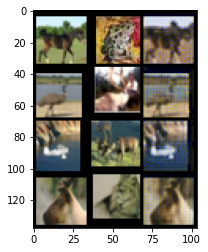

Testing - Epoch 97
overall - overall_loss = 0.13355349004268646
generator - g_loss = 0.002014234196394682
classifier - c_loss = 0.6597105264663696 acc = 0.8038


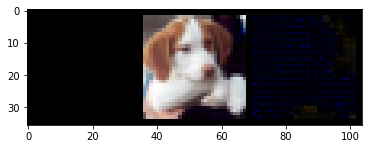

Training - Epoch 98
overall - overall_loss = 0.07216057181358337
generator - g_loss = 0.0163144338876009
classifier - c_loss = 0.2955450415611267 acc = 0.89604


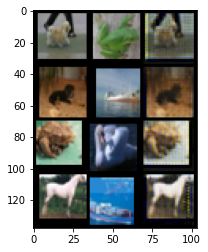

Testing - Epoch 98
overall - overall_loss = 0.1457691788673401
generator - g_loss = 0.01395777054131031
classifier - c_loss = 0.6730147004127502 acc = 0.8013


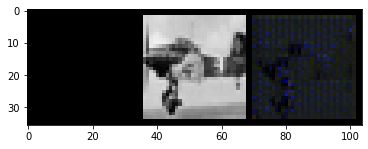

Training - Epoch 99
overall - overall_loss = 0.0698292925953865
generator - g_loss = 0.01774069108068943
classifier - c_loss = 0.2781837284564972 acc = 0.9026


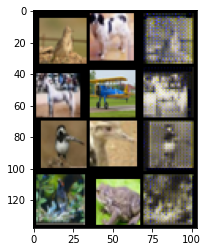

Testing - Epoch 99
overall - overall_loss = 0.13223797082901
generator - g_loss = 0.0023093584459275007
classifier - c_loss = 0.6519525051116943 acc = 0.8151


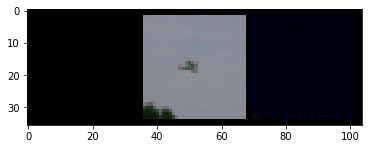

In [29]:
for epoch in range(100):
    train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True)
    test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)